<a href="https://colab.research.google.com/github/HeorhiiY/cv-course/blob/main/project/Project0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from tqdm import tqdm
from ultralytics import YOLO

In [8]:
geojson_file_path = 'data/xView_train.geojson'
import os


In [3]:
# to test later functions
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
def plot_image_with_bboxes(image_path, label_path):
    """
    Display an image with bounding boxes drawn based on YOLO labels.

    Args:
    - image_path (str): Path to the image file.
    - label_path (str): Path to the YOLO label file corresponding to the image.
    """
    # Load the image
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

    # Get image dimensions
    height, width, _ = image.shape

    # Read YOLO label file
    with open(label_path, 'r') as f:
        labels = f.readlines()

    # Draw bounding boxes
    for label in labels:
        parts = label.strip().split()
        class_id, x_center, y_center, box_width, box_height = map(float, parts)

        # Denormalize the coordinates
        x_center *= width
        y_center *= height
        box_width *= width
        box_height *= height

        # Calculate top-left and bottom-right corners
        x_min = int(x_center - box_width / 2)
        y_min = int(y_center - box_height / 2)
        x_max = int(x_center + box_width / 2)
        y_max = int(y_center + box_height / 2)

        # Draw the bounding box
        color = (255, 0, 0)  # Red color for bounding boxes
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(image, f'Class {int(class_id)}', (x_min, y_min - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Display the image
    plt.figure(figsize=(10, 6), dpi=600)
    plt.imshow(image)
    # plt.axis('off')
    plt.show()

In [4]:
# function to convert boxes
import numpy as np

def recompute_yolo_box(box, x_origin, y_origin, width, height, original_width, original_height, threshold):
    """
    Recompute YOLO bounding box coordinates for a new origin and crop.
    
    Args:
        box (np.ndarray): Bounding box coordinates in YOLO format (class, x_center, y_center, box_width, box_height).
                          All values are normalized (0 to 1).
        x_origin (int): X coordinate of the origin of the new coordinate system.
        y_origin (int): Y coordinate of the origin of the new coordinate system.
        width (int): Width of the new crop (in pixels).
        height (int): Height of the new crop (in pixels).
        threshold (float): Rejection ratio of bounding box after truncation. Recomputed
                           boxes that are heavily truncated will be discarded.
    
    Returns:
        (tuple or None): Recomputed bounding box in YOLO format (class, x_center, y_center, box_width, box_height),
                         or None if the box is too truncated or outside the crop.
    """
    cls, x_center, y_center, box_width, box_height = box
    
    # denormalize
    x_center *= original_width
    y_center *= original_height
    box_width *= original_width
    box_height *= original_height

    # get normal coordinates from yolo format
    x_min = int(x_center - box_width / 2)
    y_min = int(y_center - box_height / 2)
    x_max = int(x_center + box_width / 2)
    y_max = int(y_center + box_height / 2)
    # Recompute bounds coordinates to new reference
    # x_min, y_min, x_max, y_max = box
    x_min, y_min, x_max, y_max = x_min - x_origin, y_min - y_origin, x_max - x_origin, y_max - y_origin

    # Return None if the box does not lie within image crop
    if (x_min > width) or (x_max < 0.0) or (y_min > height) or (y_max < 0.0):
        return None
    
    # Truncate box x coordinates if necessary
    x_max_trunc = min(x_max, width)
    x_min_trunc = max(x_min, 0)
    # Skip if truncate too much
    if (x_max_trunc - x_min_trunc) / (x_max - x_min) < threshold:
        return None

    # Repeat for y coordinates
    y_max_trunc = min(y_max, width) 
    y_min_trunc = max(y_min, 0) 
    if (y_max_trunc - y_min_trunc) / (y_max - y_min) < threshold:
        return None
        
    # Convert to YOLOv8 format
    x_center = (x_min_trunc + x_max_trunc) / 2.0 / width
    y_center = (y_min_trunc + y_max_trunc) / 2.0 / height
    x_extend = (x_max_trunc - x_min_trunc) / width
    y_extend = (y_max_trunc - y_min_trunc) / height
    
    return (cls, x_center, y_center, x_extend, y_extend)

In [ ]:
# create val and train split


Full Image: 10.tif


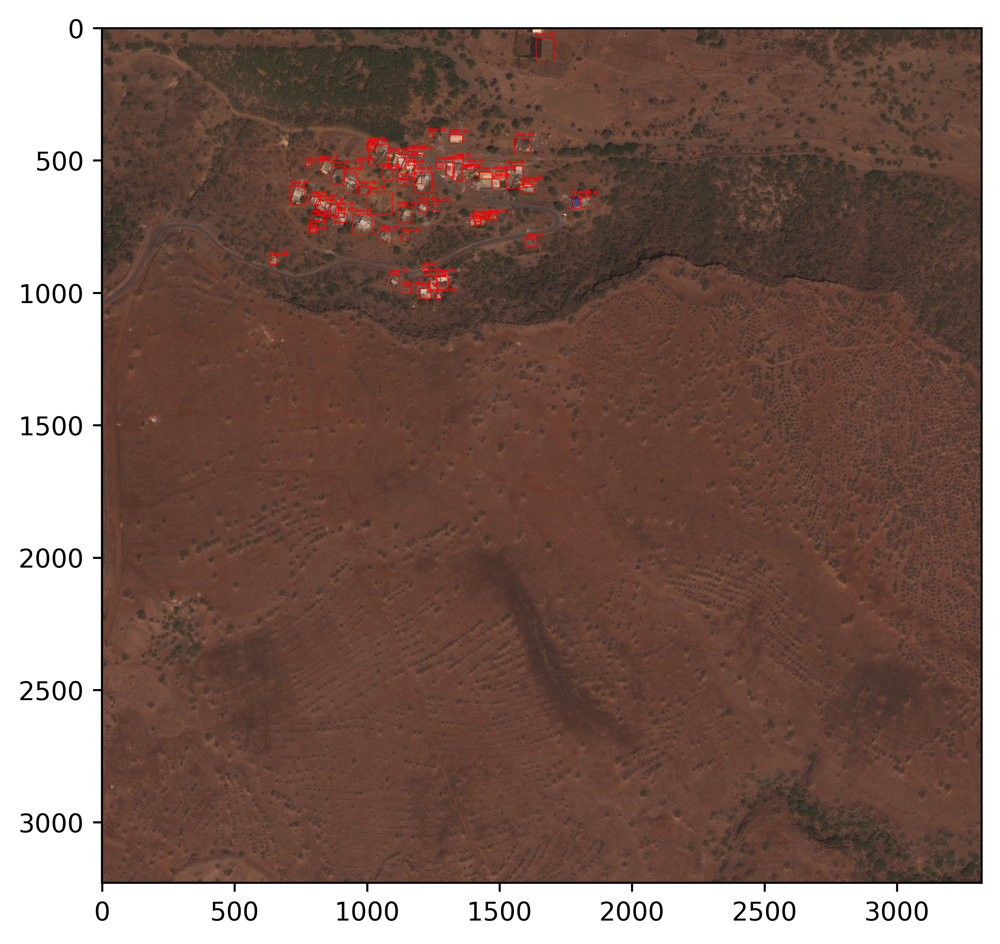

Cropped Image saved to: data\tmp\cropped_image.tif


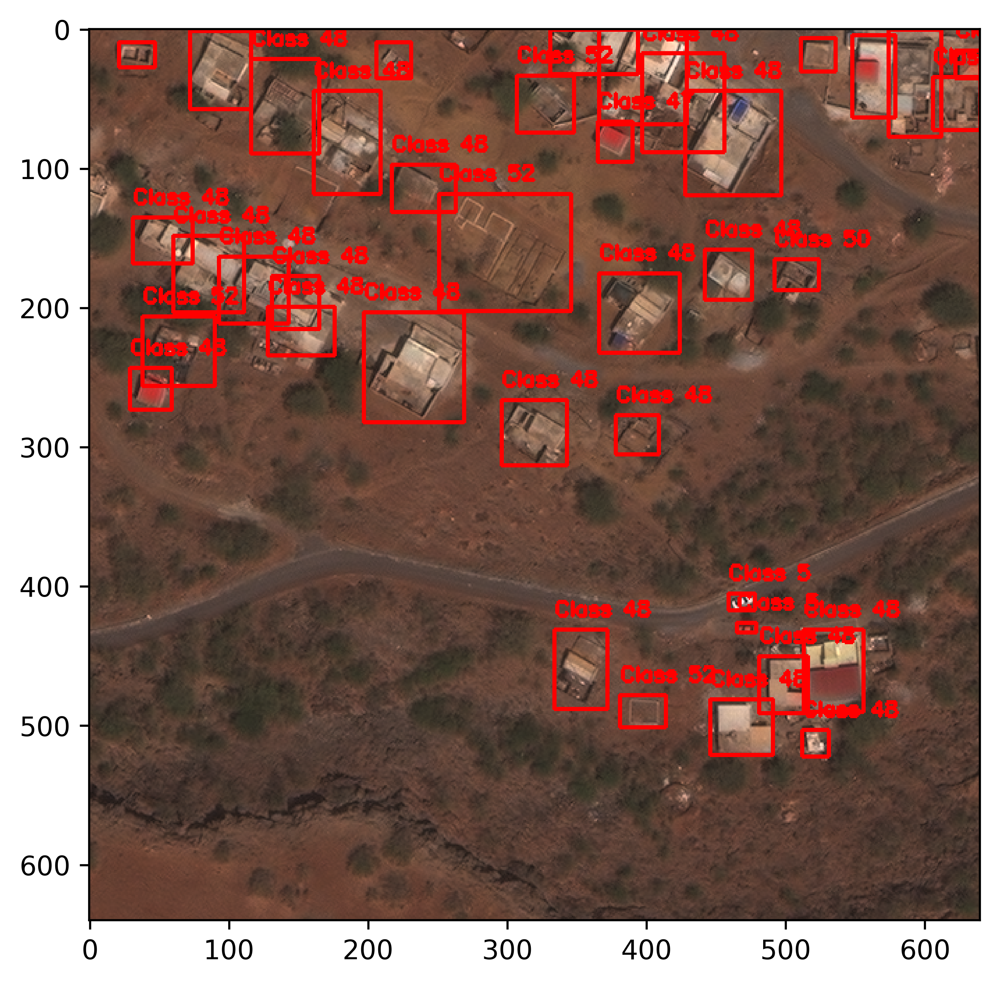

In [11]:
# test recompute box
image_folder = Path("data/train_images")
label_folder = Path("data/labels_raw/train")
output_label_folder = Path("data/tmp/")
output_label_folder.mkdir(parents=True, exist_ok=True)

# Select a single image and label file
image_path = sorted(image_folder.glob("*.tif"))[0]
label_path = sorted(label_folder.glob("*.txt"))[0]

# Display full image with bounding boxes
print(f"Full Image: {image_path.name}")
plot_image_with_bboxes(image_path, label_path)

img = cv2.imread(image_path)
original_height, original_width, _ = img.shape

# Crop settings
crop_x_origin = 750
crop_y_origin = 500
crop_width = 640
crop_height = 640
threshold = 0.5

# Read and crop the image
img = cv2.imread(str(image_path))
cropped_img = img[crop_y_origin:crop_y_origin + crop_height, crop_x_origin:crop_x_origin + crop_width]

# Read and adjust bounding boxes
with open(label_path, "r") as f:
    boxes = [list(map(float, line.split())) for line in f.readlines()]

recomputed_boxes = []
for box in boxes:
    new_box = recompute_yolo_box(box, crop_x_origin, crop_y_origin, crop_width, crop_height, original_width, original_height, threshold)
    if new_box is not None:
        recomputed_boxes.append(new_box)

# Save recomputed boxes to file
cropped_label_path = output_label_folder / "labels_cropped.txt"
with open(cropped_label_path, "w") as f:
    for box in recomputed_boxes:
        f.write(" ".join(map(str, box)) + "\n")

# Save cropped image for visualization
cropped_image_path = output_label_folder / "cropped_image.tif"
cv2.imwrite(str(cropped_image_path), cropped_img)

# Plot cropped image with new bounding boxes
print(f"Cropped Image saved to: {cropped_image_path}")
plot_image_with_bboxes(cropped_image_path, cropped_label_path)

In [5]:
import random

# Define the directory containing the label files
labels_raw_dir = Path("data/labels_raw/train")

# Get a list of all label files
label_files = list(labels_raw_dir.glob("*.txt"))

# Shuffle the list of label files


# Create a list of image IDs by stripping the '.txt' extension from the label filenames
image_ids = [label_file.stem for label_file in label_files]

seed_value = 42  # Replace with your desired seed value
random.seed(seed_value)
random.shuffle(image_ids)

In [6]:
# assign 80% of the images to train
train_split = image_ids[0:int(len(image_ids)*0.8)]

print('Num samples', len(image_ids))
print('Train split', len(train_split))
print('Val split  ', len(image_ids) - len(train_split))

Num samples 846
Train split 676
Val split   170


In [9]:
# create folders if not exist
folder_crops = {'train': 'data/train/images/',
                'val': 'data/val/images/'}

folder_labels = {'train': 'data/train/labels/',
                 'val': 'data/val/labels/'}

for folders in [folder_crops, folder_labels]:
    for _, folder in folders.items():
        if not os.path.isdir(folder):
            os.makedirs(folder)

def imread(filename):
    return cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)

In [12]:
crop_size = 512
crop_overlap = 64
trunc_th = 0.3
step = crop_size - crop_overlap

# generate crops
for img_id in tqdm(image_ids):
    imfile = image_folder / f"{img_id}.tif"
    labels_file = label_folder / f"{img_id}.txt"
    
    image = cv2.imread(imfile)
    original_height, original_width, channels = image.shape
    cols = original_width
    rows = original_height
    folder = 'train' if os.path.basename(img_id) in train_split else 'val'

    # Get annotations for image
    labels = np.loadtxt(labels_file)   

    # Extract crops
    for x_start in np.arange(0, cols - crop_size, step):
        for y_start in np.arange(0, rows - crop_size, step):

            x_end = x_start + crop_size
            y_end = y_start + crop_size
            
            filename_crop = os.path.join(folder_crops[folder],
                                         img_id + '_' + str(x_start) + '_' + str(y_start) + '.tif')
            filename_label = os.path.join(folder_labels[folder],
                                          img_id + '_' + str(x_start) + '_' + str(y_start) + '.txt')

            
            crop = image[y_start:y_end, x_start:x_end, :]
            assert crop.shape == (crop_size, crop_size, channels)                
            cv2.imwrite(filename_crop, crop)
            # change labels if only one label found
            if labels.ndim == 1:
                labels = labels[np.newaxis, :]
            try:    
                boxes = [recompute_yolo_box(boxes, x_start, y_start, crop_size, crop_size, original_width, original_height, trunc_th)
                     for boxes in labels]
            except:
                print(labels)
                print(labels_file)
                raise Exception
            boxes = [box for box in boxes if box is not None]            

            # save labels
            with open(filename_label, 'w+') as f:
                for box in boxes:
                    f.write(' '.join(str(x) for x in box) + '\n')


  2%|█▊                                                                               | 19/846 [00:11<07:35,  1.82it/s]C:\Users\streb\AppData\Local\Temp\ipykernel_50504\222602477.py:47: RuntimeWarning: invalid value encountered in scalar divide
  if (x_max_trunc - x_min_trunc) / (x_max - x_min) < threshold:
  3%|██▋                                                                              | 28/846 [00:17<06:53,  1.98it/s]C:\Users\streb\AppData\Local\Temp\ipykernel_50504\222602477.py:53: RuntimeWarning: invalid value encountered in scalar divide
  if (y_max_trunc - y_min_trunc) / (y_max - y_min) < threshold:
100%|████████████████████████████████████████████████████████████████████████████████| 846/846 [09:30<00:00,  1.48it/s]


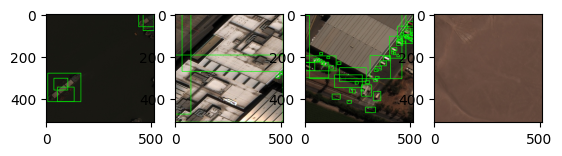

In [68]:
for idx, sample in enumerate(np.random.choice(os.listdir(folder_crops['train']), 4)):
    
    # Load image and corresponding labels
    image = imread(os.path.join(folder_crops['train'], sample))
    with open(os.path.join(folder_labels['train'], sample.replace('.jpg', '.txt')), 'r') as f:
        labels = f.readlines()

    for box in labels:
        box = np.array([d for d in box.split(' ')], dtype=np.float32)
        
        # Undo coordinate normalization
        x_center = box[1] * crop_size
        y_center = box[2] * crop_size

        width = box[3] * crop_size
        height = box[4] * crop_size

        # Convert from YOLOv8 format to OpenCV rectangle format
        x_start, y_start = int(x_center - width/2), int(y_center - height/2)
        x_end, y_end = int(x_center + width/2), int(y_center + height/2)

        cv2.rectangle(image, (x_start, y_start), (x_end, y_end), color=(0, 255, 0), thickness=2)

    plt.subplot(1,4,idx+1), plt.imshow(image)

In [80]:
model = YOLO("yolov8m.pt")
model.info()

100%|█████████████████████████████████████████████████████████████████████████████| 49.7M/49.7M [00:01<00:00, 26.4MB/s]


YOLOv8m summary: 295 layers, 25,902,640 parameters, 0 gradients, 79.3 GFLOPs


(295, 25902640, 0, 79.3204224)

In [73]:
imfiles = [image_folder / f"{img_id}.tif" for img_id in image_ids]
imfiles

[WindowsPath('data/train_images/1063.tif'),
 WindowsPath('data/train_images/2318.tif'),
 WindowsPath('data/train_images/2044.tif'),
 WindowsPath('data/train_images/1847.tif'),
 WindowsPath('data/train_images/92.tif'),
 WindowsPath('data/train_images/682.tif'),
 WindowsPath('data/train_images/1197.tif'),
 WindowsPath('data/train_images/847.tif'),
 WindowsPath('data/train_images/481.tif'),
 WindowsPath('data/train_images/370.tif'),
 WindowsPath('data/train_images/914.tif'),
 WindowsPath('data/train_images/1653.tif'),
 WindowsPath('data/train_images/546.tif'),
 WindowsPath('data/train_images/1454.tif'),
 WindowsPath('data/train_images/2520.tif'),
 WindowsPath('data/train_images/100.tif'),
 WindowsPath('data/train_images/2543.tif'),
 WindowsPath('data/train_images/2207.tif'),
 WindowsPath('data/train_images/1403.tif'),
 WindowsPath('data/train_images/561.tif'),
 WindowsPath('data/train_images/838.tif'),
 WindowsPath('data/train_images/1224.tif'),
 WindowsPath('data/train_images/2568.tif'),

In [ ]:
for idx, sample in enumerate(np.random.choice(imfiles, 4)):
    image = cv2.imread(sample)
    # image = image[1500:, 1500:, :]

    result = model.predict(image, conf=0.2)[0]
    boxes = result.boxes.cpu().numpy().xyxy.astype(np.int16)

    for box_idx, box in enumerate(boxes):
        start, stop = box[0:2], box[2:]
        cv2.rectangle(image, start, stop, color=(0, 255, 0), thickness=5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        image = cv2.putText(image, result.names[result.boxes.cls[box_idx].item()], (box[0], box[1]),
                            cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 0, 0), 6, cv2.LINE_AA)
    plt.figure(figsize=(10, 6), dpi=600)
    plt.imshow(image)